# CS7324 - Lab 2:
### Jarad, Zach Bohl, Luigi Allen
Intel Image Classification: https://www.kaggle.com/datasets/puneet6060/intel-image-classification

# 1 - Business Understanding


### Business Understanding

The dataset consists of around 25,000 images of natural scenes from various locations around the world. These images are categorized into six distinct categories: buildings, forest, glacier, mountain, sea, and street. The primary purpose of this dataset is to facilitate image classification tasks, specifically for the development of machine learning models capable of identifying and categorizing natural scenes based on visual features.

#### Purpose and Data Collection
The dataset was originally collected and provided by Intel for a public image classification challenge on DataHack, aiming to encourage research and development in image recognition. It is designed for the training and evaluation of machine learning algorithms in a well-defined classification task. 

#### Prediction Task and Stakeholders

A specialized travel community website could use this image dataset to create a dynamic and personalized platform that improves user experience by automatically sharing and discovering travel experiences. Using this dataset to train a landscape classification models, the developers can create an AI system that automatically categorizes user uploaded photos of landscapes and destinations. This allows members to automatically organize and explore image libraries based off their classification. This could allow the platform to offer personalized travel recommendations based on users' activity within a given category. For example, if a member frequently uploads or interacts with images of mountains or forests, the system can suggest comparable nature-focused destinations or travel itineraries shared by other community members. Similarly, if a user consistently uploads a specific landscape, it could recommend new destinations to build diversity in user interest.
Additionally, this image classification system powers could grow platform experience, such as Discover Similar Destinations, encouraging users to stay longer on the site, leading to increased ad revenue. The image classification can play a role in an intelligent content organization system, with professional photos and travel stories being automatically tagged and categorized. This would make it easier for users to find relevant content and inspiration. As part of an integrated broader machine learning pipeline, the image classification can help find trends in the types of images with the most engagement, as well as part of a recommendation engine for vacations and experiences that resonate with the user and/or community interests. Although it may not account for an entire pipeline, the image classification system could help enhance user interaction and drive site growth, ultimately leading to larger revenues.
More importantly, this image classification system could be the building block for more advanced features. As the building block, it could lead to a development of a hierarchical classification system that can identify not just broad landscape types, but specific landmarks or destinations. For example, the system could evolve from identifying a photo as "mountains" to recognizing it as the Rockies. As the system acquires more images from users, it could incorporate re-training algorithms to periodically improve its accuracy and expand its classification capabilities.

#### Importance of the Data
This data is important because scene recognition is crucial in many industries, from self-driving car navigation to environmental conservation. Automated classification of landscapes can speed up processes that would otherwise require manual tagging, allowing industries to process and make decisions from visual data more efficiently. The accuracy of the classification directly impacts the usability of the model for these applications.

#### Model Performance Expectations
To be useful for stakeholders, the model would need to perform with high accuracy—preferably over 90%. However, the performance threshold may vary depending on the use case. For autonomous systems, higher precision would be required to avoid errors in navigation or environmental monitoring. For general applications, slightly lower accuracy might be acceptable if it still reduces the time and cost of manual image classification.




# 2 - Data Preparation

In [11]:
import os
import random
import time

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import pandas as pd
from sklearn.decomposition import PCA
from skimage.color import rgb2gray
from skimage.feature import daisy
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import normalize
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')


In [3]:
# Define the paths to training and testing data
train_dir = 'archive/seg_train/seg_train'  
test_dir = 'archive/seg_test/seg_test'

# Categories present in the dataset
categories = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
 
# Display directory structure and image counts
print("Training Data Overview:")
for category in categories:
    path = os.path.join(train_dir, category)
    print(f"Category: {category}, Number of images: {len(os.listdir(path))}")
 
print("\nTesting Data Overview:")
test_images = os.listdir(test_dir)
print(f"Total number of test categories: {len(test_images)}")

Training Data Overview:
Category: buildings, Number of images: 2191
Category: forest, Number of images: 2271
Category: glacier, Number of images: 2404
Category: mountain, Number of images: 2512
Category: sea, Number of images: 2274
Category: street, Number of images: 2382

Testing Data Overview:
Total number of test categories: 6


Looking at the training data, it appears that each catefory is well balanced and we do not need to worry about one category skewing the dataset. The categories count in test aligns with train. 

### [.5 points] Read in your images as numpy arrays. Resize and recolor images as necessary. 

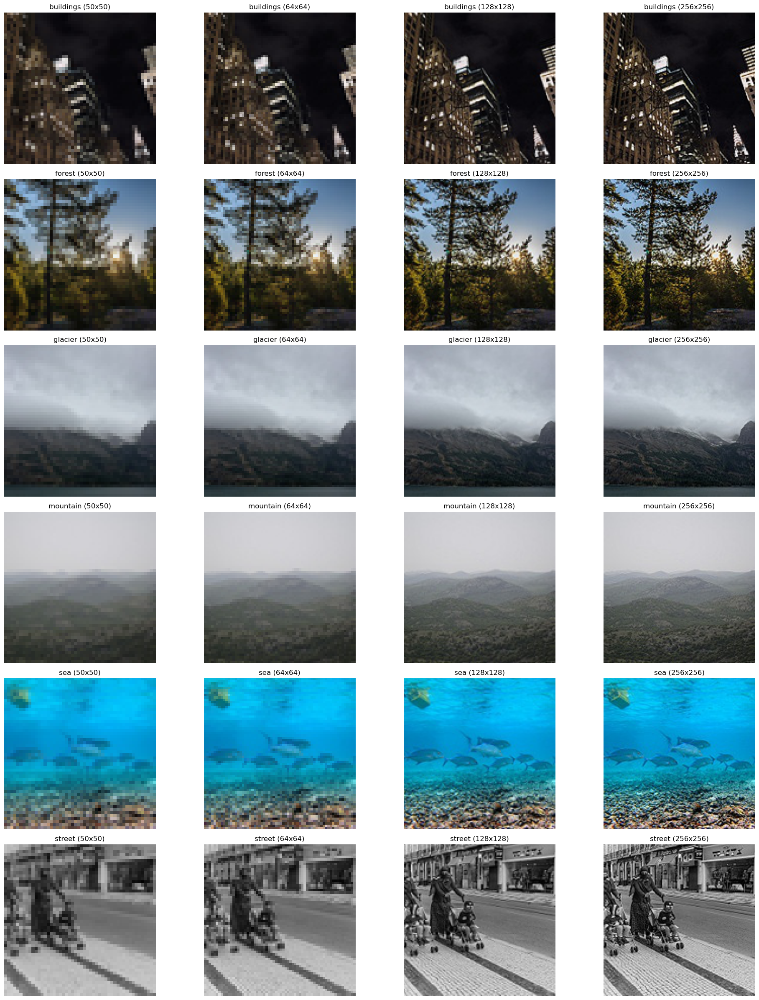

In [14]:
def visualize_categories(train_dir, categories, sizes):
    fig, axs = plt.subplots(len(categories), len(sizes), figsize=(20, 4*len(categories)))
    for i, (category, _) in enumerate(categories):
        category_path = os.path.join(train_dir, category)
        
        # look at first image in category
        img_name = os.listdir(category_path)[0]
        img_path = os.path.join(category_path, img_name)
        img = Image.open(img_path).convert('RGB')
        
        for j, size in enumerate(sizes):
            # Resize the image
            resized_img = img.resize((size, size))
            
            # Display the image
            axs[i, j].imshow(resized_img)
            axs[i, j].set_title(f"{category} ({size}x{size})")
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Define categories and sizes
categories = [('buildings', 1), ('forest', 2), ('glacier', 3), ('mountain', 4), ('sea', 5), ('street', 6)]
sizes = [50, 64, 128, 256]

visualize_categories(train_dir, categories, sizes)

We wanted to visualize different image sizes to determine the smallest yet feature rich size that we want to use for rest of the analysis. By looking at each category across a variety of standard sizes, we can see the differences and when we lose context. We are mainly looking at comparing glacier to mountains and buildings to street. We determine that 50 pxl is too small and details are lost, especially on glacier and mountains. They tend to blend together and we lose the distinction. 128 seems to be the sweet spot for discernable distinctions, but 256 will also work at the cost of being more computationally expensive. If we end up not getting reliable results, we will bump up the size to 256 and re-analyze 

In [15]:
#re using code to resize and label directory of labels
def load_images(directory, categories, target_size=(128, 128)):
    images = []
    labels = []
    
    for category, label in tqdm(categories, desc="Processing categories"):
        category_path = os.path.join(directory, category)
        
        # # Check if the category directory exists
        # if not os.path.isdir(category_path):
        #     print(f"not found for category '{category}'. Skipping.")
        #     continue
        
        # Loop through each image in the category
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            
            try:
                # Open, convert it to RGB, resize, and convert to a np array
                img = Image.open(img_path).convert('RGB').resize(target_size)
                img_array = np.array(img)
                
                # Append the image array and its label to the lists
                images.append(img_array)
                labels.append(label)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
    
    # Convert lists to NumPy arrays
    images = np.array(images)
    labels = np.array(labels)
    
    print(f"Loaded {images.shape[0]} images with shape: {images.shape[1:]}")
    
    return images, labels


In [6]:

# Loading train and test images
train_images, train_labels = load_images(train_dir, categories)
test_images, test_labels = load_images(test_dir, categories)

print("Training data shape:", train_images.shape)
print("Testing data shape:", test_images.shape)

Processing categories: 100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


Loaded 14034 images with shape: (128, 128, 3)


Processing categories: 100%|██████████| 6/6 [00:02<00:00,  2.22it/s]

Loaded 3000 images with shape: (128, 128, 3)
Training data shape: (14034, 128, 128, 3)
Testing data shape: (3000, 128, 128, 3)


### [.4 points] Linearize the images to create a table of 1-D image features (each row should be one image).   

In [7]:
# grab first eleming in np array
num_images = train_images.shape[0]

# flatten them all
flattened_images = train_images.reshape(num_images, -1)

print(f"Flattened images shape: {flattened_images.shape}")


Flattened images shape: (14034, 49152)


In [7]:
def flatten_images(images):
        num_images = images.shape[0]
        flattened_images= images.reshape(num_images,-1)
        print(f"Flattened images shape: {flattened_images.shape}")
        flattened_images = flattened_images.astype('float32') / 255.0
        df = pd.DataFrame(flattened_images)  
        return df

In [8]:
train_flat_df = flatten_images(train_images)

test_flat_df = flatten_images(test_images)

Flattened images shape: (14034, 49152)
Flattened images shape: (3000, 49152)


In [10]:
#sanity checks
train_flat_df.head(1)

,0,1,2,3,4,5,6,7,8,9,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
0,0.086275,0.066667,0.031373,0.333333,0.286275,0.176471,0.321569,0.231373,0.133333,0.313726,...,0.086275,0.062745,0.058824,0.05098,0.07451,0.066667,0.062745,0.07451,0.066667,0.062745


### [.1 points] Visualize several images.

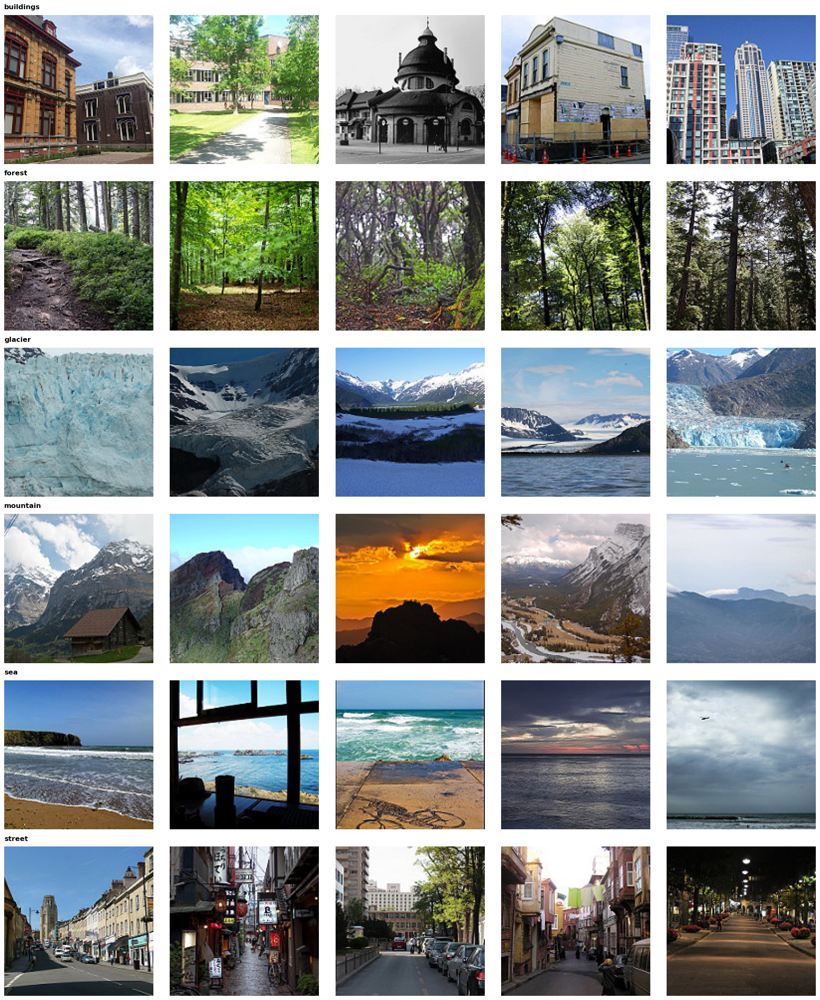

In [9]:
def display_random_images(train_dir, categories, images_per_category=5):
 
    fig, axes = plt.subplots(len(categories), images_per_category, figsize=(20, 4*len(categories)))
    
    for row, (category, _) in enumerate(categories):
        # Get path and images to randomly select
        path = os.path.join(train_dir, category)
        all_images = os.listdir(path)
        random_images = random.sample(all_images, min(images_per_category, len(all_images)))
        
        for col, img_name in enumerate(random_images):
            # show and plot images keeping them organized in rows. 
            img = Image.open(os.path.join(path, img_name))
            ax = axes[row, col] if len(categories) > 1 else axes[col]
            ax.imshow(img)
            ax.axis('off')
            if col == 0:
                ax.set_title(f"{category}", fontsize=12, fontweight='bold', loc='left', pad=10)
            ax.set_xlabel(f"{img_name}", fontsize=8)
    
    plt.tight_layout()
    plt.show()

display_random_images(train_dir, categories)

Visualizing 5 pictures from each category to get a sense of what each category contains. Interestingly, during one of my runs I noticed glacier category contains an open field with a rainbow. This does bring into question the correctness of the dataset but due to the number of images, if this is the only case, it should not affect the model too much. Additionally, mountain and glacier appear to have overlap. This could be a reason to join the categories and will need further exploration. 

# 3 - Data Reduction

In [11]:
# knowing that we had to regular and random, I made a function that takes in the reg or random as well as list of component sizes in order to avoid repeating code.
# Additionally, I added in some metadata about each pca result to help quantify which version is best to use
# This can be memory intensive and could use futher optimization
def perform_pca(df, n_components_list, pca_type="regular"):
    pca_results = {}

    for n_components in n_components_list:
        start_time = time.time()

        if pca_type == "randomized":
            pca = PCA(n_components=n_components, svd_solver='randomized')
        else:
            pca = PCA(n_components=n_components)

        pca_result = pca.fit_transform(df.values)
        explained_variance = np.cumsum(pca.explained_variance_ratio_)

        end_time = time.time()
        
        pca_results[n_components] = {
            'pca': pca,
            'pca_result': pca_result,
            'explained_variance': explained_variance,
            'components': pca.components_,
            'explained_variance_ratio': pca.explained_variance_ratio_,
            'execution_time': end_time - start_time
        }

        print(f"n_components={n_components} ({pca_type} PCA):")
        print(f"Original shape: {df.shape}")
        print(f"Reduced shape after PCA: {pca_result.shape}")
        print(f"Execution time: {pca_results[n_components]['execution_time']:.2f} seconds")
     

    return pca_results


# We took your visualize function but adapted it to work with a range of n components for easier visualization.
def visualize_pca_explained_variance(pca_results):
    n_components_list = list(pca_results.keys())

    fig = make_subplots(rows=1, cols=len(n_components_list),
                        subplot_titles=[f'PCA with {n} Components' for n in n_components_list])

    for idx, n_components in enumerate(n_components_list):
        explained_variance = pca_results[n_components]['explained_variance']
        cum_var_exp = np.cumsum(explained_variance)
        
        fig.add_trace(
            go.Bar(y=explained_variance, name='Individual Explained Variance'),
            row=1, col=idx+1
        )
        
        # fig.add_trace(
        #     go.Scatter(y=cum_var_exp, name='Cumulative Explained Variance'),
        #     row=1, col=idx+1
        # )
        
        fig.update_xaxes(title_text='Principal Components', row=1, col=idx+1)
        fig.update_yaxes(title_text='Explained Variance Ratio', row=1, col=idx+1)
   
    fig.update_layout(
        showlegend=False,
        width=300 * len(n_components_list),  
        height=500
    )

    fig.show()


#Stole your reconstruct code but modified it for RGB
def reconstruct_image(trans_obj, org_features):
    
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image

def reconstruct_images_for_n_components(train_flat_df, pca_results, idx_to_reconstruct, h, w):
    
    X_idx = train_flat_df.iloc[idx_to_reconstruct].values  # Original image to reconstruct

    # Set up subplots
    plt.figure(figsize=(12, len(pca_results) * 4))
    
    # Plot the original image in the first subplot
    plt.subplot(1, len(pca_results) + 1, 1)
    plt.imshow(X_idx.reshape((h, w, 3)), cmap=plt.cm.gray)  
    plt.title('Original Image')
    plt.grid(False)

    # Loop and reconstruct the image
    for i, (n_components, pca_info) in enumerate(pca_results.items()):
        pca = pca_info['pca']  # Get the PCA object

        # Reconstruct the image using PCA
        low_dimensional_representation, reconstructed_image = reconstruct_image(pca, X_idx.reshape(1, -1))
        
        # Plot 
        plt.subplot(1, len(pca_results) + 1, i + 2)
        plt.imshow(reconstructed_image.reshape((h, w, 3)), cmap=plt.cm.gray)  
        plt.title(f'Reconstructed with {n_components} Components')
        plt.grid(False)

    # Show all
    plt.tight_layout()
    plt.show()




In [17]:
# Use regular PCA
n_components_list = [10] # 25, 50, 100]
pca_results = perform_pca(train_flat_df, n_components_list, pca_type="regular")


n_components=10 (regular PCA):
Original shape: (14034, 49152)
Reduced shape after PCA: (14034, 10)



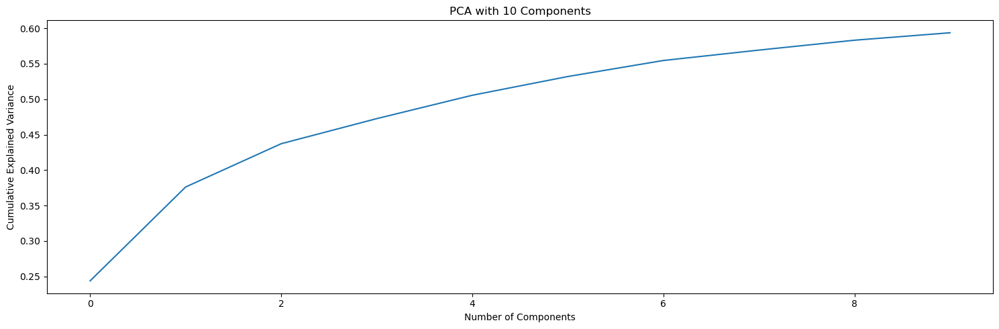

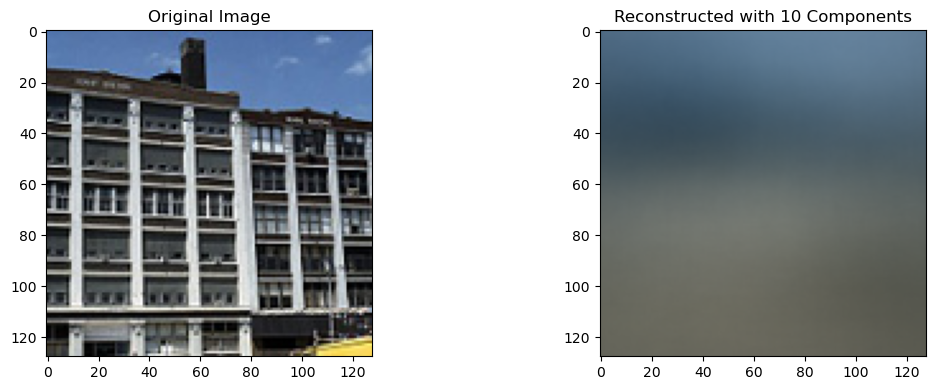

In [18]:
# Visualize the explained variance
visualize_pca_explained_variance(pca_results)

# Reconstruct and visualize the original and reconstructed images
reconstruct_images_for_n_components(train_flat_df, pca_results, idx_to_reconstruct=1, h=128, w=128)



n_components=10 (randomized PCA):
Original shape: (14034, 49152)
Reduced shape after PCA: (14034, 10)



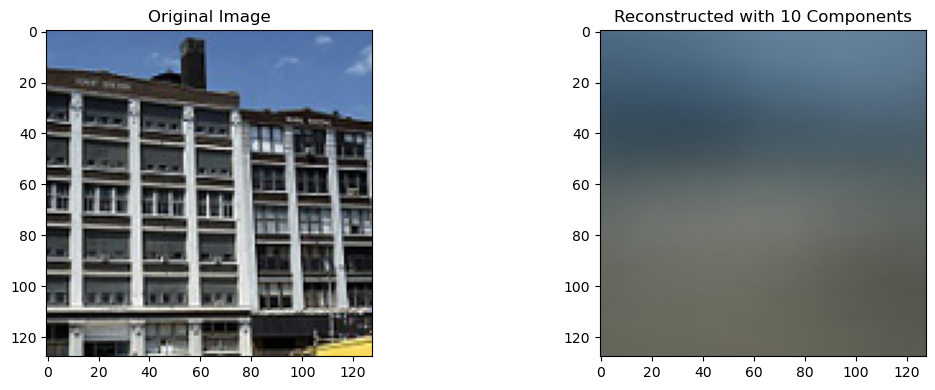

In [21]:
# Use regular PCA
n_components_list = [10] # 25, 50, 100]
pca_results = perform_pca(train_flat_df, n_components_list, pca_type="randomized")

# Reconstruct and visualize the original and reconstructed images
reconstruct_images_for_n_components(train_flat_df, pca_results, idx_to_reconstruct=1, h=128, w=128)

In [13]:


# Compare reconstruction error for PCA and Randomized PCA.
def compare_reconstruction_error(original, pca_reconstructed, rpca_reconstructed):
    pca_mse = mean_squared_error(original, pca_reconstructed)
    rpca_mse = mean_squared_error(original, rpca_reconstructed)
    return {'PCA_MSE': pca_mse, 'RPCA_MSE': rpca_mse}

# Compare correlation between corresponding components of PCA and Randomized PCA.
def compare_component_correlation(pca_components, rpca_components):
    correlations = []
    for i in range(min(pca_components.shape[1], rpca_components.shape[1])):
        corr, _ = pearsonr(pca_components[:, i], rpca_components[:, i])
        correlations.append(corr)
    return correlations

# Compare correlation between corresponding components of PCA and Randomized PCA.
def compare_execution_time(pca_time, rpca_time):
    speedup = pca_time / rpca_time
    return {
        'PCA_Time': pca_time,
        'RPCA_Time': rpca_time,
        'Speedup_Factor': speedup
    }

# Compare explained variance ratios of PCA and Randomized PCA.
def compare_explained_variance_ratio(pca_evr, rpca_evr):
    pca_cumulative = np.cumsum(pca_evr)
    rpca_cumulative = np.cumsum(rpca_evr)
    return {
        'PCA_Cumulative_EVR': pca_cumulative,
        'RPCA_Cumulative_EVR': rpca_cumulative
    }

In [14]:
def compare_pca_methods(original_data, pca_results, rpca_results):
    comparisons = {}

    for n_components in pca_results.keys():
        pca_info = pca_results[n_components]
        rpca_info = rpca_results[n_components]

        _, pca_reconstructed = reconstruct_image(pca_info['pca'], original_data)
        _, rpca_reconstructed = reconstruct_image(rpca_info['pca'], original_data)

        recon_error = compare_reconstruction_error(original_data, pca_reconstructed, rpca_reconstructed)
        correlations = compare_component_correlation(pca_info['components'], rpca_info['components'])
        time_comparison = compare_execution_time(pca_info['execution_time'], rpca_info['execution_time'])
        evr_comparison = compare_explained_variance_ratio(pca_info['explained_variance_ratio'], rpca_info['explained_variance_ratio'])
        comparisons[n_components] = {
            'reconstruction_error': recon_error,
            'component_correlations': correlations,
            'execution_time': time_comparison,
            'explained_variance_ratio': evr_comparison
        }

    return comparisons

In [18]:
# Perform regular PCA and randomized PCA
n_components_list = [100, 200]  # Example list of components
pca_results = perform_pca(train_flat_df, n_components_list, pca_type="regular")
rpca_results = perform_pca(train_flat_df, n_components_list, pca_type="randomized")

# Visualize 
visualize_pca_explained_variance(pca_results)
visualize_pca_explained_variance(rpca_results)

# Reconstruct
reconstruct_images_for_n_components(train_flat_df, pca_results, idx_to_reconstruct=1, h=128, w=128)
reconstruct_images_for_n_components(train_flat_df, rpca_results, idx_to_reconstruct=1, h=128, w=128)

# call compare
comparisons = compare_pca_methods(train_flat_df.values, pca_results, rpca_results)

# get summary stats
for n_components, comparison in comparisons.items():
    print(f"\nComparison for {n_components} components:")
    print(f"Reconstruction Error: {comparison['reconstruction_error']}")
    print(f"Execution Time: {comparison['execution_time']}")
    print(f"Average Component Correlation: {np.mean(comparison['component_correlations'])}")
    print(f"Explained Variance Ratio Difference: {np.sum(np.abs(comparison['explained_variance_ratio']['PCA_Cumulative_EVR'] - comparison['explained_variance_ratio']['RPCA_Cumulative_EVR']))}")
 

n_components=100 (regular PCA):
Original shape: (14034, 49152)
Reduced shape after PCA: (14034, 100)
Execution time: 19.25 seconds


In [16]:
def perform_knn_on_pca_results(pca_results, labels, n_neighbors=5, test_size=0.2, random_state=42):

    knn_accuracies = {}
    
    for n_components, pca_info in pca_results.items():
        # Get the PCA-transformed data
        X = pca_info['pca_result']
        
        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, labels, test_size=test_size, random_state=random_state)
        
        # Create and fit the KNN classifier
        knn = KNeighborsClassifier(n_neighbors=n_neighbors)
        knn.fit(X_train, y_train)
        
        # Make predictions and calculate accuracy
        y_pred = knn.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        
        knn_accuracies[n_components] = accuracy
    
    return knn_accuracies

In [17]:
# Assuming you have already computed PCA results and have labels
pca_knn_results = perform_knn_on_pca_results(pca_results, train_labels)
rpca_knn_results = perform_knn_on_pca_results(rpca_results, train_labels)

# Print the results
print("Regular PCA KNN Accuracies:")
for n_components, accuracy in pca_knn_results.items():
    print(f"  {n_components} components: {accuracy:.4f}")

print("\nRandomized PCA KNN Accuracies:")
for n_components, accuracy in rpca_knn_results.items():
    print(f"  {n_components} components: {accuracy:.4f}")

/Users/jarad/opt/anaconda3/envs/smu_ml/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Regular PCA KNN Accuracies:
  100 components: 0.5301

Randomized PCA KNN Accuracies:
  100 components: 0.5283


/Users/jarad/opt/anaconda3/envs/smu_ml/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.




### Regular vs Randomized PCA

Initially we wanted to obeserve the graphs of explained variance and the differences in the reconstructed images. When comparing side by side, it is hard to tell any difference between the two. Except for the small loss in explained variance. The reconstructed images at 100 components make the images unrecognizable compared to the input image, so it is safe to say that we can explore higher components in further iterations. With that said, we can not make a quantifiable difference until we examine the metadated created during operation. In order to determine which one is truly better, we added metadata and mse to the reconstructed images to give use hard numbers to compare.

Our analysis between regular and randomized PCA reveals the well-known trade-off between speed and accuracy. Initially, we are using 100 components as a starting point, and with a smaller number of components we can still see that RPCA is notably faster, and outperforming regular by 16%. Despite the speed difference they both yield nearly identical reconstruction errors, RPCA shows a slight dip in explained variance and KNN classifier accuracy. If we were to only consider that metric, we would still choose RPCA for this task. Beyong variance and accuracy, we can see that the high average component correlation between the two methods suggests RPCA still captures the main key components. As we scale up the number of components we will compare and contrast the results to determine the best number of components for our given task. Based on the preliminary results 

Sources for memmap and batching:  https://numpy.org/doc/stable/reference/generated/numpy.memmap.html, https://stackoverflow.com/questions/32242911/using-memmap-files-for-batch-processing

In [7]:
def extract_daisy_features(image, step=10, radius=20, rings=2, histograms=8, orientations=8):
    gray_image = rgb2gray(image)
    return daisy(gray_image, step=step, radius=radius, rings=rings, 
                 histograms=histograms, orientations=orientations, visualize=False)

# Our dataset is close to 20000 images, at first I didn't try batching and quickly ran out of memory, so after that I tried batching to help ease the memory load but 
# even then I was still running into memory issues. My first thought was to pickle the results so I could retrieve them as needed but talking with a coworker, he suggest memmap and helped me set up 
# batching with memmap. After this implementation, the load on memory was cut by more than 50% and I can retrieve my features at any point after. 
def extract_features_in_batches(images, batch_size=50, output_file=None):
    sample_features = extract_daisy_features(images[0])
    feature_shape = sample_features.shape

    if output_file:
        features = np.memmap(output_file, dtype='float32', mode='w+', 
                             shape=(len(images), *feature_shape))
    else:
        features = np.zeros((len(images), *feature_shape), dtype='float32')

    for i in tqdm(range(0, len(images), batch_size)):
        batch = images[i:i+batch_size]
        batch_features = np.array([extract_daisy_features(img) for img in batch])
        features[i:i+len(batch_features)] = batch_features
    
    return features
# Using cosine simularity to measure the distance between 3d features to keep dimensionality, computes average after geting similarity scores to create 1 overall score
def feature_wise_cosine_similarity(A, B):
    dot_product = np.sum(A * B, axis=-1)
    magnitude_A = np.sqrt(np.sum(A**2, axis=-1))
    magnitude_B = np.sqrt(np.sum(B**2, axis=-1))
    similarity = dot_product / (magnitude_A * magnitude_B)
    
    
    return np.mean(similarity)

# Using batches once again to compute all similarity scores image by image test against train. using memmap in order to not run out of memory
def precompute_similarities_in_batches(train_features, test_features, batch_size=100, output_file=None):
    if output_file:
        similarities = np.memmap(output_file, dtype='float32', mode='w+', 
                                 shape=(len(test_features), len(train_features)))
    else:
        similarities = np.zeros((len(test_features), len(train_features)), dtype='float32')

    for i in tqdm(range(0, len(test_features), batch_size)):
        test_batch = test_features[i:i+batch_size]
        
        for j in range(0, len(train_features), batch_size):
            train_batch = train_features[j:j+batch_size]
            
            batch_similarities = np.array([[feature_wise_cosine_similarity(test_sample, train_sample) 
                                            for train_sample in train_batch] 
                                           for test_sample in test_batch])
            
            similarities[i:i+len(test_batch), j:j+len(train_batch)] = batch_similarities

    return similarities

# Classifies the image given a selected threshold. Uses the saved similarities and tests to see if it is higher than threshold. if it is higher, it selects highest freq class as it classification
def classify_images_by_threshold_in_batches(similarities, train_labels, threshold=0.9, batch_size=1000):
    predictions = []
    for i in tqdm(range(0, len(similarities), batch_size)):
        sim_batch = similarities[i:i+batch_size]
        batch_predictions = []
        for sim_row in sim_batch:
            matches = sim_row >= threshold
            if np.any(matches):
                unique_labels, counts = np.unique(train_labels[matches], return_counts=True)
                batch_predictions.append(unique_labels[np.argmax(counts)])
            else:
                batch_predictions.append(None)
        predictions.extend(batch_predictions)
    return predictions

# Usage
train_features = extract_features_in_batches(train_images, batch_size=100, 
                                             output_file='train_features.memmap')
test_features = extract_features_in_batches(test_images, batch_size=100, 
                                            output_file='test_features.memmap')

similarities = precompute_similarities_in_batches(train_features, test_features, batch_size=100, 
                                                  output_file='similarities.memmap')

predictions = classify_images_by_threshold_in_batches(similarities, train_labels, batch_size=1000)

100%|██████████| 3/3 [00:00<00:00, 12.45it/s]


In [10]:
np.save('predictions.npy', predictions)
np.save('test_labels.npy', test_labels)
np.save('train_lablels', train_labels)  

In [11]:
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def preprocess_labels(labels):
    # Convert all labels to strings
    return [str(label) for label in labels]

def analyze_results(predictions, true_labels, categories):
    # Preprocess labels
    predictions = preprocess_labels(predictions)
    true_labels = preprocess_labels(true_labels)
    
    # Create a mapping from category numbers to names
    category_map = {str(num): name for name, num in categories}
    
    # Convert numeric labels to category names
    predictions = [category_map.get(p, 'Unknown') if p != 'Unknown' else p for p in predictions]
    true_labels = [category_map[t] for t in true_labels]
    
    # Basic counts
    total_predictions = len(predictions)
    unknown_count = predictions.count('Unknown')
    known_count = total_predictions - unknown_count
    
    print(f"Total predictions: {total_predictions}")
    print(f"Known predictions: {known_count} ({known_count/total_predictions:.2%})")
    print(f"Unknown predictions: {unknown_count} ({unknown_count/total_predictions:.2%})")
    
    # Accuracy (excluding 'Unknown' predictions)
    known_predictions = [p for p in predictions if p != 'Unknown']
    known_true_labels = [true_labels[i] for i, p in enumerate(predictions) if p != 'Unknown']
    accuracy = accuracy_score(known_true_labels, known_predictions)
    print(f"\nAccuracy (excluding 'Unknown'): {accuracy:.2%}")
    
    # Classification report
    print("\nClassification Report:")
    print(classification_report(true_labels, predictions))
    
    # Confusion Matrix
    label_set = sorted(set(true_labels + predictions))
    cm = confusion_matrix(true_labels, predictions, labels=label_set)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_set, yticklabels=label_set)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.tight_layout()
    plt.show()


Total predictions: 3000
Known predictions: 2886 (96.20%)
Unknown predictions: 114 (3.80%)

Accuracy (excluding 'Unknown'): 43.45%

Classification Report:
              precision    recall  f1-score   support

     Unknown       0.00      0.00      0.00         0
   buildings       0.77      0.11      0.20       437
      forest       0.29      0.99      0.45       474
     glacier       0.49      0.32      0.39       553
    mountain       0.58      0.48      0.52       525
         sea       0.71      0.45      0.55       510
      street       0.86      0.16      0.27       501

    accuracy                           0.42      3000
   macro avg       0.53      0.36      0.34      3000
weighted avg       0.61      0.42      0.40      3000



/Users/jarad/opt/anaconda3/envs/smu_ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/jarad/opt/anaconda3/envs/smu_ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/jarad/opt/anaconda3/envs/smu_ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


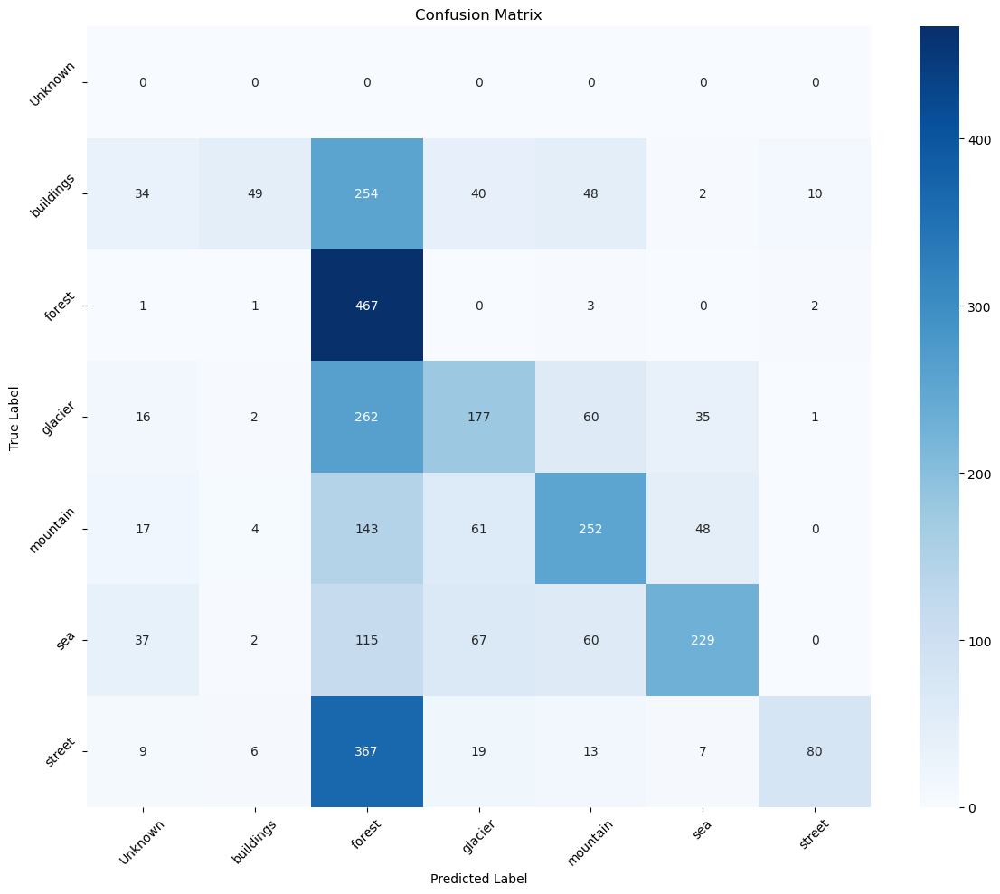

In [12]:
# Load your results
predictions = np.load('predictions.npy', allow_pickle=True)
true_labels = np.load('test_labels.npy', allow_pickle=True)

# Analyze results
analyze_results(predictions, true_labels, categories)

### Test Feature to Train Feature head to head match up


The daisy feature matching comparison demonstrates a lackluster overall performance with an accuracy of 43.45% across all six categories. While the categories are fairly balanced, some of them did better than others. 


High precision for buildings and street indicates that when a match is found for these classes, it's usually correct. The low recall, however, suggests that the threshold might be missing many potential matches for these classes.
High recall for 'Forest' indicates that most 'Forest' images in the test set find a match in the training set, but the low precision suggests that many non-'Forest' images also get matched to 'Forest' images, likely due to shared visual textures or patterns captured by DAISY features.
The more balanced precision and recall for 'Glacier', 'Mountain', and 'Sea' suggest a moderate ability to find relevant matches for these classes.


Additionally, there's a notable challenge in correctly identifying buildings, with many being misclassified as forest or sea. We suspect that this is caused by having many straight vertical lines, like trees for instance that causes a misclassification. We initially entered a high threshold of 0.9 but that might be one cause of the subpar performance, another could be lowering our step to get more features and capture more details. We think that this could help when differentiating between visually similar landscapes. One area of focus could be on lowering the amount of times the images "match" to forest, if that is lowered we could see a boost in accuracy. 

In [ ]:
def load_memmap(filename, shape, dtype='float32'):
    return np.memmap(filename, dtype=dtype, mode='r', shape=shape)

def compute_centroids(features, labels, categories):
    centroids = {}
    for category, _ in categories:
        category_features = features[labels == category]
        centroids[category] = np.mean(category_features, axis=0)
    return centroids

def nearest_centroid_classifier(test_features, centroids):
    predictions = []
    for test_feature in tqdm(test_features):
        similarities = {category: cosine_similarity([test_feature], [centroid])[0][0]
                        for category, centroid in centroids.items()}
        predicted_category = max(similarities, key=similarities.get)
        predictions.append(predicted_category)
    return predictions

# Load your data
train_features = load_memmap('train_features.memmap', shape=(N_TRAIN, *FEATURE_SHAPE))
test_features = load_memmap('test_features.memmap', shape=(N_TEST, *FEATURE_SHAPE))
train_labels = np.load('train_labels.npy')
test_labels = np.load('test_labels.npy')

# Define categories
categories = [('buildings', 1), ('forest', 2), ('glacier', 3), ('mountain', 4), ('sea', 5), ('street', 6)]

# Compute centroids
centroids = compute_centroids(train_features, train_labels, categories)

# Classify test features
predictions = nearest_centroid_classifier(test_features, centroids)

# Evaluate the results
accuracy = np.mean(np.array(predictions) == test_labels)
print(f"Accuracy: {accuracy:.2%}")

# Optional: Generate a classification report
from sklearn.metrics import classification_report
print(classification_report(test_labels, predictions))

In [8]:
def extract_daisy_features(image, step=10, radius=20, rings=2, histograms=8, orientations=8, average=False):
    
    gray_image = rgb2gray(image)
    daisy_features = daisy(gray_image, step=step, radius=radius, rings=rings, 
                           histograms=histograms, orientations=orientations, visualize=False)
    
    if average:
        return daisy_features.mean(axis=(0, 1))  # Return the average across the spatial dimensions
    else:
        # return daisy_features.flatten()  # Flatten the features to a 1D array
        return daisy_features


# whoops ran out of memory so creating batches instead
def extract_features_in_batches(images, batch_size=50, average=False):
    features = []
    for i in tqdm(range(0, len(images), batch_size)):
        batch = images[i:i+batch_size]
        # Extract features for each image in the batch
        batch_features = [extract_daisy_features(img, average=average) for img in batch]
        features.extend(batch_features)
    
    return np.array(features)



In [9]:
def precompute_similarities(train_features, test_features):
    # Normalize features for faster cosine similarity computation
    train_features_norm = normalize(train_features)
    test_features_norm = normalize(test_features)
    
    # Compute similarities
    similarities = cosine_similarity(test_features_norm, train_features_norm)
    return similarities

def classify_images_by_threshold(similarities, train_labels, threshold=0.9):
    predictions = []
    for sim_row in similarities:
        matches = sim_row >= threshold
        if np.any(matches):
            unique_labels, counts = np.unique(train_labels[matches], return_counts=True)
            predictions.append(unique_labels[np.argmax(counts)])
        else:
            predictions.append(None)
    return predictions

In [10]:
train_features = extract_features_in_batches(train_images, batch_size=100, average=False)
test_features = extract_features_in_batches(test_images, batch_size=100, average=False)

similarities = precompute_similarities(train_features, test_features)
predictions = classify_images_by_threshold(similarities, train_labels)

 14%|█▍        | 20/141 [00:42<04:14,  2.10s/it]


KeyboardInterrupt: 

In [12]:

# Extract features with averaging (one feature vector per image)
X_train_avg = extract_features_in_batches(train_images, batch_size=50, average=True)
print(f"Averaged DAISY features shape: {X_train_avg.shape}")

y_train = train_labels

# Extract features from testing images
print("Extracting features from testing images...")
X_test_avg = extract_features_in_batches(train_images, batch_size=50, average=True)
y_test = test_labels

print(f"Training features shape: {X_train_avg.shape}")
print(f"Testing features shape: {X_test_avg.shape}")

100%|██████████| 281/281 [02:43<00:00,  1.72it/s]


Averaged DAISY features shape: (14034, 136)
Extracting features from testing images...


100%|██████████| 281/281 [02:42<00:00,  1.73it/s]

Training features shape: (14034, 136)
Testing features shape: (14034, 136)


In [18]:
def calculate_similarity(feature1, feature2):
    return cosine_similarity(feature1.reshape(1, -1), feature2.reshape(1, -1))[0][0]


def classify_image_by_threshold(test_image, train_features, train_labels, threshold=0.9):
 
    # Track matches for each label
    label_counts = {}
    
    for train_feature, train_label in zip(train_features, train_labels):
        similarity = calculate_similarity(test_image, train_feature)
        
        # If similarity exceeds the threshold, consider it a match
        if similarity >= threshold:
            if train_label not in label_counts:
                label_counts[train_label] = 0
            label_counts[train_label] += 1
    
    # Find the label with the most matches
    if label_counts:
        return max(label_counts, key=label_counts.get)
    else:
        return None  # No matches found
    
def classify_image_by_category_average(test_image, category_averages):
    
    best_label = None
    highest_similarity = -1
    
    for label, avg_feature in category_averages.items():
        similarity = calculate_similarity(test_image, avg_feature)
        
        if similarity > highest_similarity:
            highest_similarity = similarity
            best_label = label
    
    return best_label

def compute_category_averages(train_features, train_labels):
  
    category_averages = {}
    
    # Group features by label
    unique_labels = np.unique(train_labels)
    
    for label in unique_labels:
        label_features = train_features[train_labels == label]
        category_averages[label] = np.mean(label_features, axis=0)
    
    return category_averages


In [17]:
# Assume X_train contains features for training images and y_train contains corresponding labels

# Compute category averages for Method 2
category_averages = compute_category_averages(X_train_avg, y_train)

# For each test image, classify using both methods
for test_image, true_label in zip(X_test_avg, y_test):
    
    # Method 1: Classify by threshold-based matching
    predicted_label_threshold = classify_image_by_threshold(test_image, X_train_avg, y_train, threshold=0.95)
    
    # Method 2: Classify by category averages
    predicted_label_average = classify_image_by_category_average(test_image, category_averages)
    
    print(f"True Label: {true_label}, Predicted (Threshold): {predicted_label_threshold},Predicted (Average): {predicted_label_average}")


True Label: 1, Predicted (Threshold): 6,
True Label: 1, Predicted (Threshold): 3,
True Label: 1, Predicted (Threshold): 6,
True Label: 1, Predicted (Threshold): 3,
True Label: 1, Predicted (Threshold): 6,
True Label: 1, Predicted (Threshold): 1,
True Label: 1, Predicted (Threshold): 6,
True Label: 1, Predicted (Threshold): 6,


KeyboardInterrupt: 

In [25]:
from sklearn.neighbors import NearestCentroid
from sklearn.metrics import classification_report, accuracy_score

print("Training NearestCentroid classifier...")
clf = NearestCentroid()
clf.fit(X_train, y_train)

# Make predictions on the test set
print("Making predictions...")
y_pred = clf.predict(X_test)

# Calculate and print the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy:.4f}")

# Print a detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Training NearestCentroid classifier...
Making predictions...

Accuracy: 0.5880

Classification Report:
              precision    recall  f1-score   support

           1       0.56      0.46      0.50       437
           2       0.60      0.93      0.73       474
           3       0.46      0.51      0.49       553
           4       0.56      0.49      0.52       525
           5       0.65      0.64      0.64       510
           6       0.77      0.51      0.61       501

    accuracy                           0.59      3000
   macro avg       0.60      0.59      0.58      3000
weighted avg       0.60      0.59      0.58      3000



In [26]:
from sklearn.neighbors import KNeighborsClassifier


# Initialize the KNN classifier
# You can adjust the number of neighbors (n_neighbors) as needed
print("Training KNeighborsClassifier...")
knn = KNeighborsClassifier(n_neighbors=5)  # 5 is a common default, but you may want to tune this

# Train the classifier
knn.fit(X_train, y_train)

# Make predictions on the test set
print("Making predictions...")
y_pred = knn.predict(X_test)

# Calculate and print the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy:.4f}")

# Print a detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Training KNeighborsClassifier...
Making predictions...

Accuracy: 0.3873

Classification Report:
              precision    recall  f1-score   support

           1       0.62      0.04      0.08       437
           2       0.30      0.99      0.46       474
           3       0.49      0.13      0.20       553
           4       0.51      0.36      0.42       525
           5       0.45      0.75      0.56       510
           6       0.97      0.06      0.11       501

    accuracy                           0.39      3000
   macro avg       0.56      0.39      0.31      3000
weighted avg       0.55      0.39      0.31      3000



/Users/jarad/opt/anaconda3/envs/smu_ml/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


### Citations
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.

https://www.jcchouinard.com/pca-explained-variance/